In [1]:
import cv2

In [2]:
from keras.preprocessing.image import load_img, img_to_array, ImageDataGenerator

In [3]:
import matplotlib.pyplot as plt

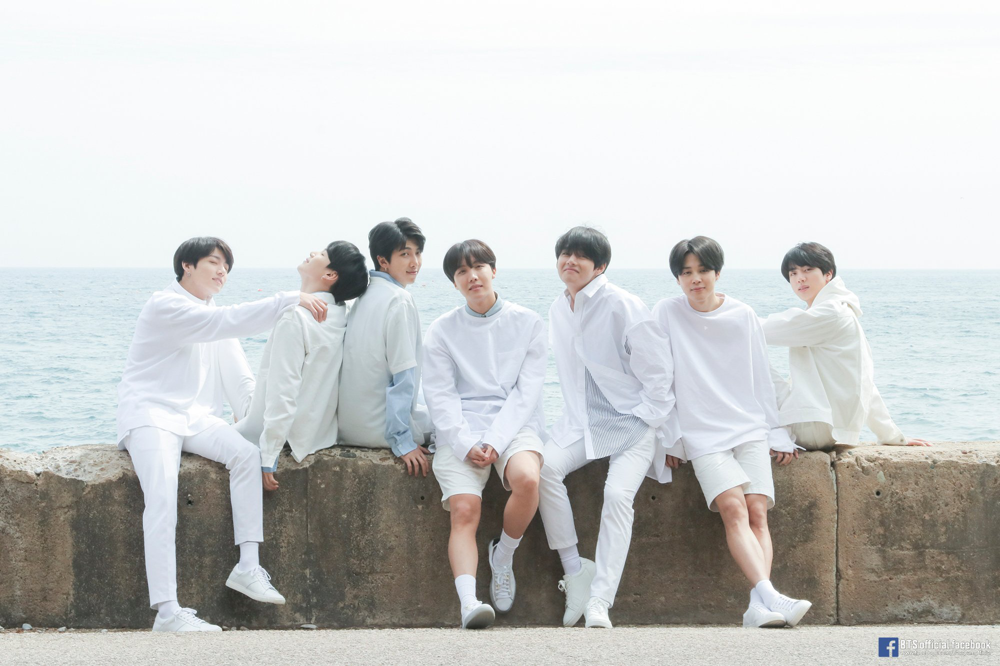

In [4]:
img=load_img('mybts.jpg')
img

In [5]:
data=img_to_array(img)
data

array([[[250., 251., 253.],
        [250., 251., 253.],
        [250., 251., 253.],
        ...,
        [253., 253., 253.],
        [253., 253., 253.],
        [253., 253., 253.]],

       [[250., 251., 253.],
        [250., 251., 253.],
        [250., 251., 253.],
        ...,
        [253., 253., 253.],
        [253., 253., 253.],
        [253., 253., 253.]],

       [[250., 251., 253.],
        [250., 251., 253.],
        [250., 251., 253.],
        ...,
        [253., 253., 253.],
        [253., 253., 253.],
        [253., 253., 253.]],

       ...,

       [[201., 202., 197.],
        [204., 205., 200.],
        [203., 204., 199.],
        ...,
        [224., 225., 219.],
        [220., 221., 215.],
        [212., 213., 207.]],

       [[220., 221., 216.],
        [217., 218., 213.],
        [208., 209., 204.],
        ...,
        [217., 218., 212.],
        [218., 219., 213.],
        [212., 213., 207.]],

       [[218., 219., 214.],
        [230., 231., 226.],
        [236., 2

In [7]:
from numpy import expand_dims

In [8]:
samples=expand_dims(data, 0)
samples

array([[[[250., 251., 253.],
         [250., 251., 253.],
         [250., 251., 253.],
         ...,
         [253., 253., 253.],
         [253., 253., 253.],
         [253., 253., 253.]],

        [[250., 251., 253.],
         [250., 251., 253.],
         [250., 251., 253.],
         ...,
         [253., 253., 253.],
         [253., 253., 253.],
         [253., 253., 253.]],

        [[250., 251., 253.],
         [250., 251., 253.],
         [250., 251., 253.],
         ...,
         [253., 253., 253.],
         [253., 253., 253.],
         [253., 253., 253.]],

        ...,

        [[201., 202., 197.],
         [204., 205., 200.],
         [203., 204., 199.],
         ...,
         [224., 225., 219.],
         [220., 221., 215.],
         [212., 213., 207.]],

        [[220., 221., 216.],
         [217., 218., 213.],
         [208., 209., 204.],
         ...,
         [217., 218., 212.],
         [218., 219., 213.],
         [212., 213., 207.]],

        [[218., 219., 214.],
       

In [9]:
datagen=ImageDataGenerator(width_shift_range=[-200,200]) # 범위 지정
datagen

In [10]:
it=datagen.flow(samples, batch_size=1)

In [11]:
fig=plt.figure(figsize=(30,30))

<Figure size 2160x2160 with 0 Axes>

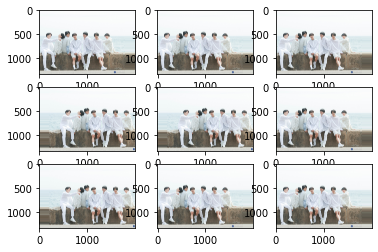

In [12]:
for i in range(9):
    plt.subplot(3,3,i+1)
    batch=it.next()
    image=batch[0].astype('uint8')
    plt.imshow(image)

In [13]:
datagen=ImageDataGenerator(height_shift_range=0.5)

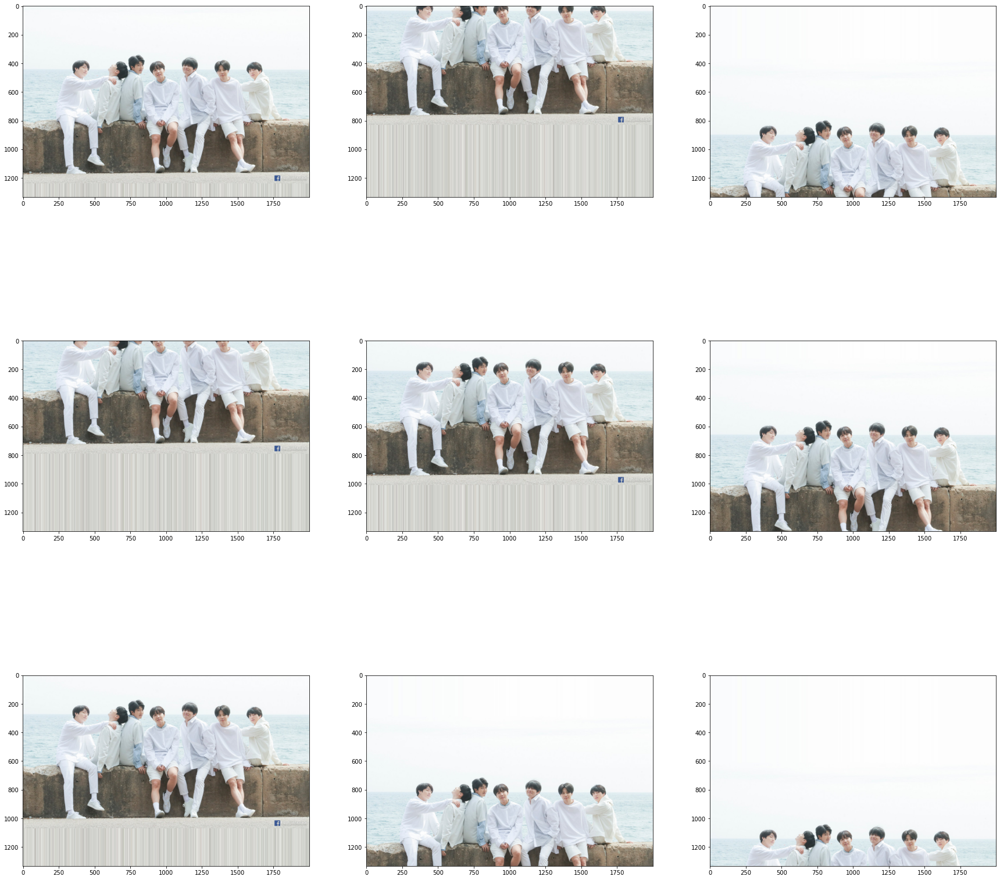

In [14]:
it=datagen.flow(samples, batch_size=1)
fig=plt.figure(figsize=(30,30))
for i in range(9):
    plt.subplot(3,3,i+1)
    batch=it.next()
    image=batch[0].astype('uint8')
    plt.imshow(image)

In [15]:
datagen=ImageDataGenerator(horizontal_flip=True, vertical_flip=True)

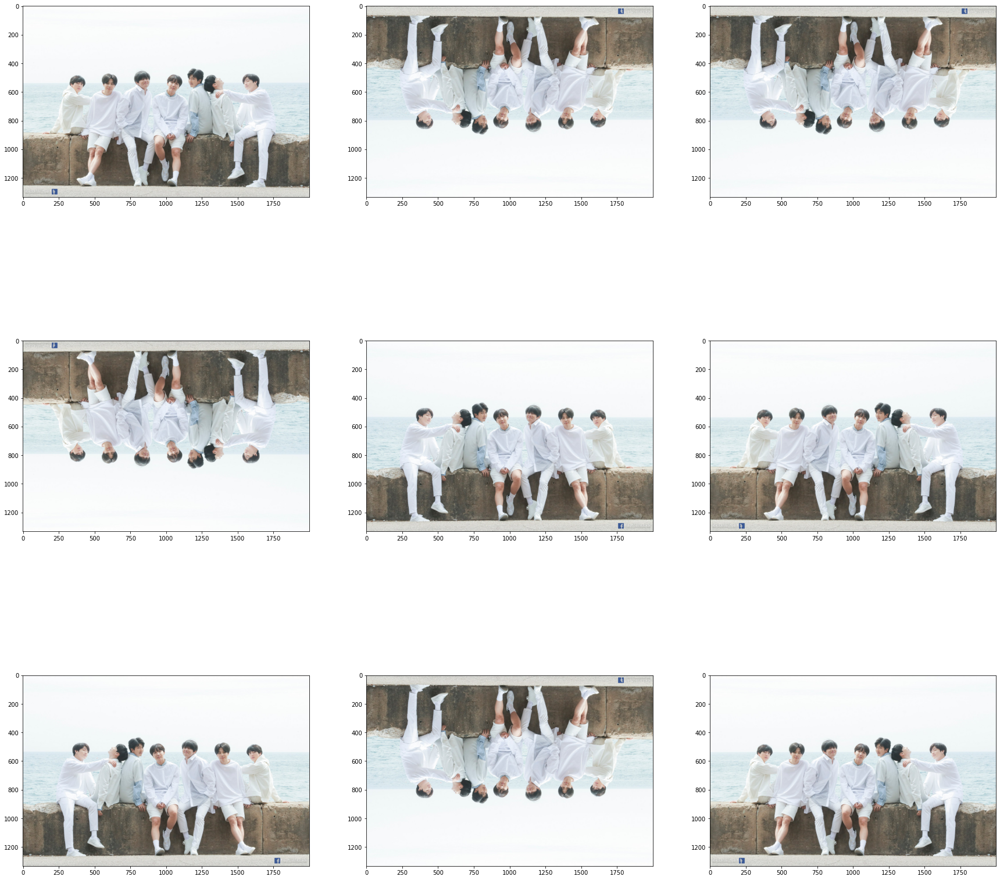

In [16]:
it=datagen.flow(samples, batch_size=1)
fig=plt.figure(figsize=(30,30))
for i in range(9):
    plt.subplot(3,3,i+1)
    batch=it.next()
    image=batch[0].astype('uint8')
    plt.imshow(image)

In [17]:
datagen=ImageDataGenerator(rotation_range=90)

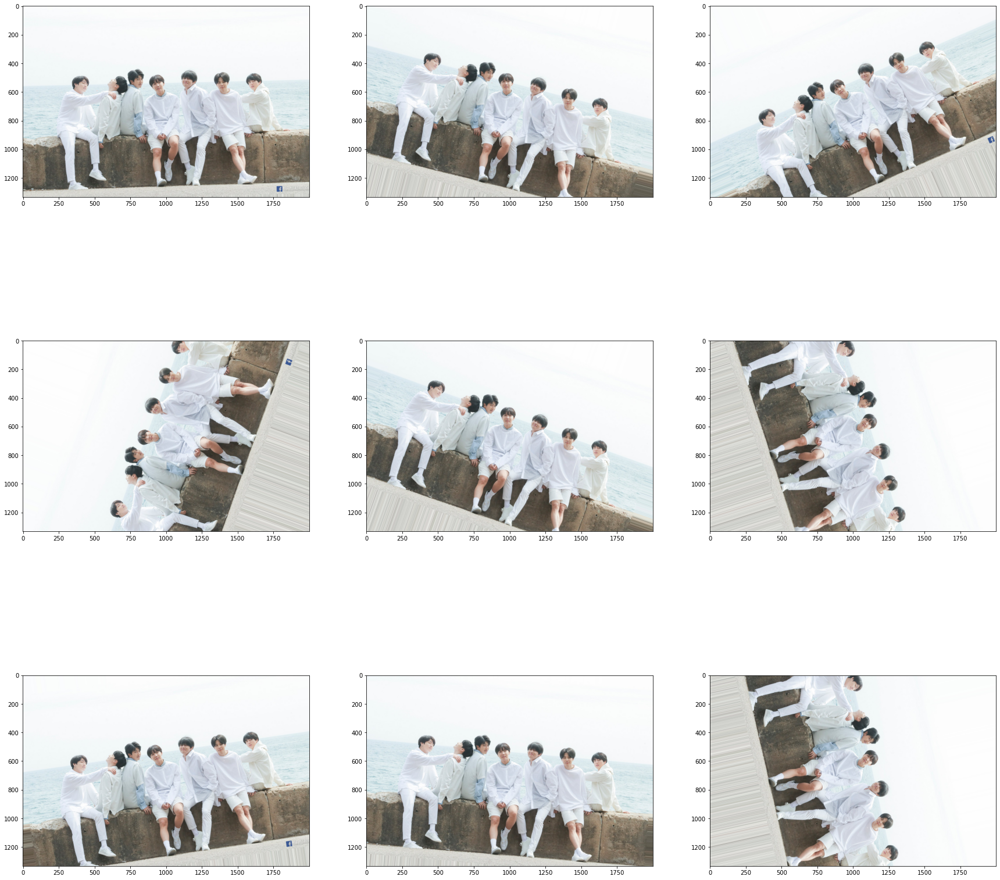

In [18]:
it=datagen.flow(samples, batch_size=1)
fig=plt.figure(figsize=(30,30))
for i in range(9):
    plt.subplot(3,3,i+1)
    batch=it.next()
    image=batch[0].astype('uint8')
    plt.imshow(image)

In [19]:
datagen=ImageDataGenerator(brightness_range=[0, 0.5]) # 밝기 조정 (0:어두움~1:밝음)

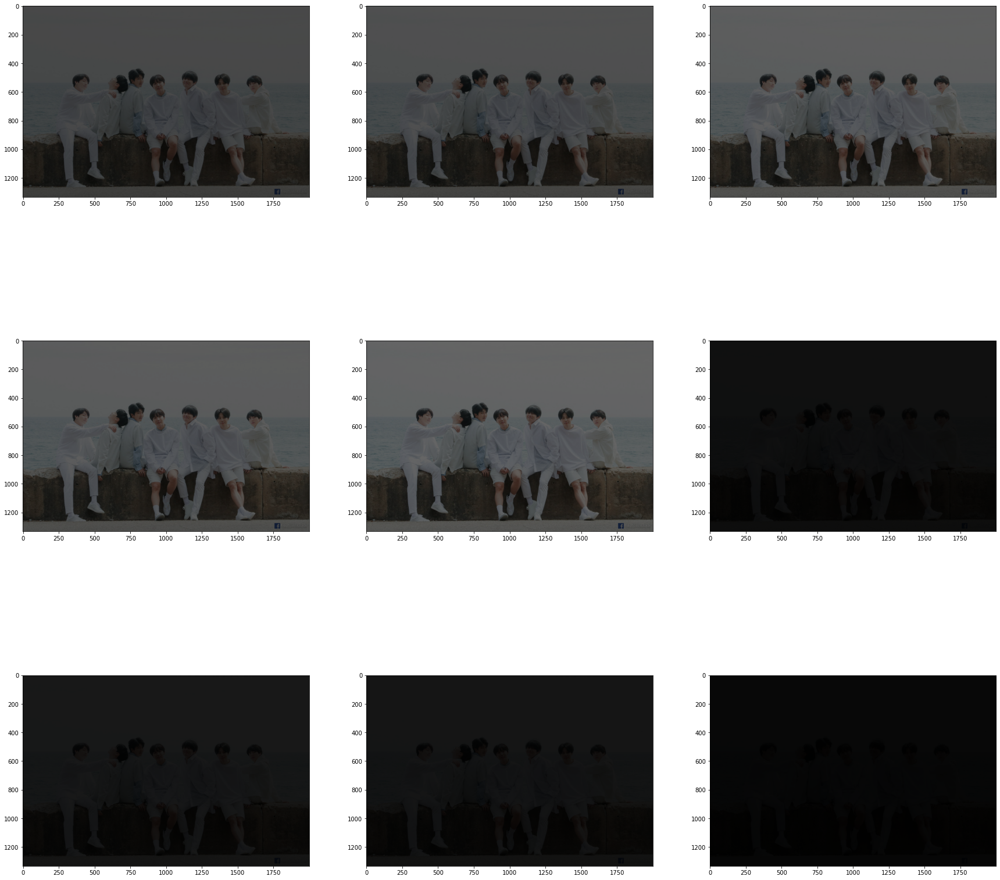

In [20]:
it=datagen.flow(samples, batch_size=1)
fig=plt.figure(figsize=(30,30))
for i in range(9):
    plt.subplot(3,3,i+1)
    batch=it.next()
    image=batch[0].astype('uint8')
    plt.imshow(image)

In [21]:
datagen=ImageDataGenerator(zoom_range=[0.5,1])

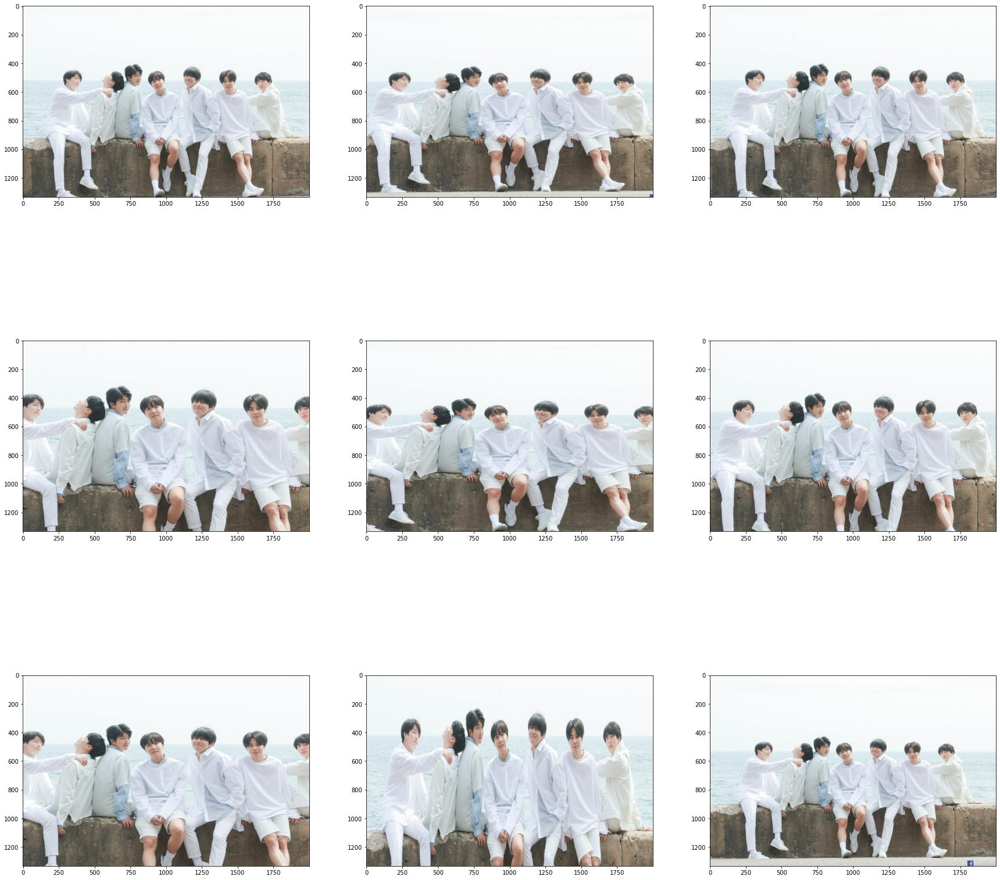

In [22]:
it=datagen.flow(samples, batch_size=1)
fig=plt.figure(figsize=(30,30))
for i in range(9):
    plt.subplot(3,3,i+1)
    batch=it.next()
    image=batch[0].astype('uint8')
    plt.imshow(image)

In [29]:
import keras
import numpy as np
import cv2
 
np.random.seed(15)
 
path = 'example'

In [30]:
generator = keras.preprocessing.image.ImageDataGenerator(
    rotation_range = 20,
    width_shift_range = 0.2,
    height_shift_range = 0.2,
    rescale = 1. / 255) # 0<=픽셀값<=1

In [31]:
batch_size = 4 # 한번에 4장의 이미지를 읽어옴
iterations = 5 # 5번의 이미지 증식
images = []

In [32]:
obj = generator.flow_from_directory(
    path,
    target_size = (150, 150),
    batch_size = batch_size,
    class_mode = 'binary')

Found 4 images belonging to 2 classes.


In [35]:
for i in enumerate(range(iterations)):
    img, label = obj .next()
    n_img = len(label)
    base=cv2.cvtColor(img[0], cv2.COLOR_RGB2BGR)
    for idx in range(n_img - 1):
        img2 = cv2.cvtColor(img[idx + 1], cv2.COLOR_RGB2BGR)
        base = np.hstack((base, img2))
    images.append(base)
img = images[0]
for idx in range(len(images) - 1):
    img = np.vstack((img, images[idx + 1]))

In [36]:
cv2.imshow('result', img)
cv2.waitKey()
cv2.destroyAllWindows()


In [ ]:
#Conv2D(32, (5,5), padding='valid', input_shape=(28,28,3), activation='relu')

In [37]:
import numpy
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Flatten
from keras.layers.convolutional import Conv2D
from keras.layers.convolutional import MaxPooling2D
from keras.utils import np_utils
model = Sequential()

model.add(Conv2D(2, (3, 3), padding='same', activation='relu', input_shape=(8, 8, 1)))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Conv2D(3, (2, 2), padding='same', activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Flatten())
model.add(Dense(8, activation='relu'))
model.add(Dense(3, activation='softmax'))

In [38]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 8, 8, 2)           20        
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 4, 4, 2)           0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 4, 4, 3)           27        
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 2, 2, 3)           0         
_________________________________________________________________
flatten (Flatten)            (None, 12)                0         
_________________________________________________________________
dense (Dense)                (None, 8)                 104       
_________________________________________________________________
dense_1 (Dense)              (None, 3)                 2

In [39]:
train_datagen=ImageDataGenerator(rescale=1./255)

In [40]:
train_geneartor=train_datagen.flow_from_directory(
    'hand/handwriting_shape/train',
    target_size=(24,24),
    batch_size=3,
    class_mode='categorical'
)

Found 45 images belonging to 3 classes.


In [41]:
test_datagen=ImageDataGenerator(rescale=1./255)

In [42]:
test_geneartor=train_datagen.flow_from_directory(
    'hand/handwriting_shape/test',
    target_size=(24,24),
    batch_size=3,
    class_mode='categorical'
)

Found 15 images belonging to 3 classes.


In [43]:
model = Sequential()
model.add(Conv2D(32, kernel_size=(3, 3),
                 activation='relu',
                 input_shape=(24,24,3)))
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dense(3, activation='softmax'))

In [44]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_2 (Conv2D)            (None, 22, 22, 32)        896       
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 20, 20, 64)        18496     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 10, 10, 64)        0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 6400)              0         
_________________________________________________________________
dense_2 (Dense)              (None, 128)               819328    
_________________________________________________________________
dense_3 (Dense)              (None, 3)                 387       
Total params: 839,107
Trainable params: 839,107
Non-trainable params: 0
________________________________________________

In [45]:
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

In [46]:
model.fit_generator(train_geneartor,
                   steps_per_epoch=15, # 1에폭(총 45장)=배치 3장*15번 반복
                   epochs=50,
                   validation_data=test_geneartor,
                   validation_steps=5)

Instructions for updating:
Please use Model.fit, which supports generators.
Epoch 1/50
15/15 [==============================] - 1s 52ms/step - loss: 1.1672 - accuracy: 0.5111 - val_loss: 0.5999 - val_accuracy: 1.0000
Epoch 2/50
15/15 [==============================] - 0s 24ms/step - loss: 0.3707 - accuracy: 0.8444 - val_loss: 0.1818 - val_accuracy: 1.0000
Epoch 3/50
15/15 [==============================] - 0s 22ms/step - loss: 0.0541 - accuracy: 1.0000 - val_loss: 0.1128 - val_accuracy: 0.9333
Epoch 4/50
15/15 [==============================] - 0s 24ms/step - loss: 0.0069 - accuracy: 1.0000 - val_loss: 0.0448 - val_accuracy: 1.0000
Epoch 5/50
15/15 [==============================] - 0s 21ms/step - loss: 0.0015 - accuracy: 1.0000 - val_loss: 0.0200 - val_accuracy: 1.0000
Epoch 6/50
15/15 [==============================] - 0s 22ms/step - loss: 9.1955e-04 - accuracy: 1.0000 - val_loss: 0.0197 - val_accuracy: 1.0000
Epoch 7/50
15/15 [==============================] - 0s 23ms/step - loss: 4

In [47]:
model.evaluate_generator(test_geneartor, steps=5)

Instructions for updating:
Please use Model.evaluate, which supports generators.


[0.004963670391589403, 1.0]

In [48]:
output=model.predict_generator(test_geneartor, steps=5)
print(output)

Instructions for updating:
Please use Model.predict, which supports generators.
[[9.9999738e-01 2.6777218e-06 1.6323298e-08]
 [1.7184561e-08 5.8267033e-04 9.9941730e-01]
 [3.1026484e-10 1.3344217e-07 9.9999988e-01]
 [2.5540663e-07 9.9999952e-01 2.1694588e-07]
 [2.4676865e-06 9.9999619e-01 1.3156576e-06]
 [7.2185118e-03 9.3623412e-01 5.6547429e-02]
 [9.9999821e-01 1.8131142e-06 3.2921238e-10]
 [9.5537374e-09 1.8537845e-08 1.0000000e+00]
 [2.6045379e-06 9.9999726e-01 7.5867142e-08]
 [9.4854465e-11 1.0613295e-06 9.9999893e-01]
 [9.9214774e-01 5.5183796e-04 7.3004621e-03]
 [4.0080380e-05 9.9995959e-01 4.0534312e-07]
 [9.9999940e-01 5.9975093e-07 6.7353362e-10]
 [9.5044961e-10 3.0514682e-05 9.9996948e-01]
 [9.9998498e-01 1.5025995e-05 4.9475393e-08]]


In [58]:
np.random.seed(3)

from keras.preprocessing.image import ImageDataGenerator

# 데이터셋 불러오기
train_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
        'hand/handwriting_shape/train',
        target_size=(24, 24),
        batch_size=3,
        class_mode='categorical')

Found 45 images belonging to 3 classes.


In [59]:
test_generator = train_datagen.flow_from_directory(
        'hand/handwriting_shape/test',
        target_size=(24, 24),
        batch_size=3,
        class_mode='categorical')

Found 30 images belonging to 3 classes.


In [60]:
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Flatten
from keras.layers.convolutional import Conv2D
from keras.layers.convolutional import MaxPooling2D


model = Sequential()
model.add(Conv2D(32, kernel_size=(3, 3),
                 activation='relu',
                 input_shape=(24,24,3)))
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dense(3, activation='softmax'))

In [61]:
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

model.fit_generator(
        train_generator,
        steps_per_epoch=15,
        epochs=200,
        validation_data=test_generator,
        validation_steps=5)

Epoch 1/200
15/15 [==============================] - 1s 49ms/step - loss: 1.0692 - accuracy: 0.4889 - val_loss: 0.9803 - val_accuracy: 0.5333
Epoch 2/200
15/15 [==============================] - 0s 26ms/step - loss: 0.3066 - accuracy: 0.8667 - val_loss: 1.7488 - val_accuracy: 0.4000
Epoch 3/200
15/15 [==============================] - 0s 24ms/step - loss: 0.0488 - accuracy: 0.9778 - val_loss: 1.5151 - val_accuracy: 0.7333
Epoch 4/200
15/15 [==============================] - 0s 26ms/step - loss: 0.0060 - accuracy: 1.0000 - val_loss: 1.9780 - val_accuracy: 0.6667
Epoch 5/200
15/15 [==============================] - 0s 25ms/step - loss: 0.0013 - accuracy: 1.0000 - val_loss: 2.2626 - val_accuracy: 0.6000
Epoch 6/200
15/15 [==============================] - 0s 31ms/step - loss: 3.1509e-04 - accuracy: 1.0000 - val_loss: 0.6920 - val_accuracy: 0.8667
Epoch 7/200
15/15 [==============================] - 0s 26ms/step - loss: 1.8904e-04 - accuracy: 1.0000 - val_loss: 2.6227 - val_accuracy: 0.666

Epoch 57/200
15/15 [==============================] - 0s 25ms/step - loss: 2.7551e-07 - accuracy: 1.0000 - val_loss: 4.6325 - val_accuracy: 0.5333
Epoch 58/200
15/15 [==============================] - 0s 28ms/step - loss: 2.6226e-07 - accuracy: 1.0000 - val_loss: 1.7796 - val_accuracy: 0.8667
Epoch 59/200
15/15 [==============================] - 0s 22ms/step - loss: 2.5166e-07 - accuracy: 1.0000 - val_loss: 2.2625 - val_accuracy: 0.7333
Epoch 60/200
15/15 [==============================] - 0s 25ms/step - loss: 2.4372e-07 - accuracy: 1.0000 - val_loss: 2.1765 - val_accuracy: 0.8000
Epoch 61/200
15/15 [==============================] - 0s 22ms/step - loss: 2.3312e-07 - accuracy: 1.0000 - val_loss: 2.8757 - val_accuracy: 0.7333
Epoch 62/200
15/15 [==============================] - 0s 21ms/step - loss: 2.2252e-07 - accuracy: 1.0000 - val_loss: 3.7984 - val_accuracy: 0.6667
Epoch 63/200
15/15 [==============================] - 0s 20ms/step - loss: 2.1458e-07 - accuracy: 1.0000 - val_loss: 3

15/15 [==============================] - 0s 23ms/step - loss: 5.0333e-08 - accuracy: 1.0000 - val_loss: 3.9404 - val_accuracy: 0.6000
Epoch 113/200
15/15 [==============================] - 0s 24ms/step - loss: 5.2982e-08 - accuracy: 1.0000 - val_loss: 1.5808 - val_accuracy: 0.8667
Epoch 114/200
15/15 [==============================] - 0s 20ms/step - loss: 4.7684e-08 - accuracy: 1.0000 - val_loss: 1.9823 - val_accuracy: 0.8667
Epoch 115/200
15/15 [==============================] - 0s 20ms/step - loss: 4.7684e-08 - accuracy: 1.0000 - val_loss: 3.3665 - val_accuracy: 0.7333
Epoch 116/200
15/15 [==============================] - 0s 23ms/step - loss: 4.7684e-08 - accuracy: 1.0000 - val_loss: 1.5131 - val_accuracy: 0.8667
Epoch 117/200
15/15 [==============================] - 0s 24ms/step - loss: 4.7684e-08 - accuracy: 1.0000 - val_loss: 2.6791 - val_accuracy: 0.7333
Epoch 118/200
15/15 [==============================] - 0s 23ms/step - loss: 4.5035e-08 - accuracy: 1.0000 - val_loss: 3.4659 -

15/15 [==============================] - 0s 24ms/step - loss: 2.1193e-08 - accuracy: 1.0000 - val_loss: 3.5619 - val_accuracy: 0.6667
Epoch 168/200
15/15 [==============================] - 0s 24ms/step - loss: 2.1193e-08 - accuracy: 1.0000 - val_loss: 5.1661 - val_accuracy: 0.5333
Epoch 169/200
15/15 [==============================] - 0s 22ms/step - loss: 2.1193e-08 - accuracy: 1.0000 - val_loss: 4.5920 - val_accuracy: 0.6000
Epoch 170/200
15/15 [==============================] - 0s 22ms/step - loss: 1.8544e-08 - accuracy: 1.0000 - val_loss: 3.2858 - val_accuracy: 0.7333
Epoch 171/200
15/15 [==============================] - 0s 25ms/step - loss: 1.8544e-08 - accuracy: 1.0000 - val_loss: 3.5319 - val_accuracy: 0.6667
Epoch 172/200
15/15 [==============================] - 0s 23ms/step - loss: 1.8544e-08 - accuracy: 1.0000 - val_loss: 2.6249 - val_accuracy: 0.7333
Epoch 173/200
15/15 [==============================] - 0s 24ms/step - loss: 1.8544e-08 - accuracy: 1.0000 - val_loss: 4.2252 -

In [62]:
scores = model.evaluate_generator(
            test_generator, 
            steps = 5)

print("%s: %.2f%%" %(model.metrics_names[1], scores[1]*100))

output = model.predict_generator(
            test_generator, 
            steps = 5)

np.set_printoptions(formatter={'float': lambda x: "{0:0.3f}".format(x)})

print(output)

accuracy: 60.00%
[[0.901 0.000 0.099]
 [0.000 0.000 1.000]
 [0.000 1.000 0.000]
 [0.000 1.000 0.000]
 [0.000 0.000 1.000]
 [0.000 0.000 1.000]
 [0.000 0.018 0.982]
 [0.000 0.000 1.000]
 [0.000 0.000 1.000]
 [0.000 0.003 0.997]
 [1.000 0.000 0.000]
 [0.000 0.000 1.000]
 [0.000 1.000 0.000]
 [0.122 0.759 0.119]
 [0.000 0.000 1.000]]


In [63]:
np.random.seed(5)

from keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img


data_aug_gen = ImageDataGenerator(rescale=1./255, 
                                  rotation_range=15,
                                  width_shift_range=0.1,
                                  height_shift_range=0.1,
                                  shear_range=0.5,
                                  zoom_range=[0.8, 2.0],
                                  horizontal_flip=True,
                                  vertical_flip=True,
                                  fill_mode='nearest')

In [66]:
load_img('hand/handwriting_shape/train/triangle/triangle001.png')

In [69]:
img = load_img('hand/handwriting_shape/train/triangle/triangle001.png')
x = img_to_array(img)
x = x.reshape((1,) + x.shape)

i = 0
for batch in data_aug_gen.flow(x, batch_size=1, save_to_dir='hand/preview', save_prefix='tri', save_format='png'):
    i += 1
    if i > 30: 
        break

In [70]:
train_datagen = ImageDataGenerator(rescale=1./255, 
                                   rotation_range=15,
                                   width_shift_range=0.1,
                                   height_shift_range=0.1,
                                   shear_range=0.5,
                                   zoom_range=[0.8, 2.0],
                                   horizontal_flip=True,
                                   vertical_flip=True,
                                   fill_mode='nearest')

In [72]:
train_generator = train_datagen.flow_from_directory(
        'hand/handwriting_shape/train',
        target_size=(24, 24),
        batch_size=3,
        class_mode='categorical')

Found 45 images belonging to 3 classes.


In [76]:
test_datagen = ImageDataGenerator(rescale=1./255)

test_generator = test_datagen.flow_from_directory(
        'hand/handwriting_shape/test2',
        target_size=(24, 24),    
        batch_size=3,
        class_mode='categorical')

Found 15 images belonging to 3 classes.


In [75]:
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Flatten
from keras.layers.convolutional import Conv2D
from keras.layers.convolutional import MaxPooling2D

from keras.layers import Dropout

model = Sequential()
model.add(Conv2D(32, kernel_size=(3, 3),
                 activation='relu',
                 input_shape=(24,24,3)))
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dense(3, activation='softmax'))


model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

In [77]:
model.fit_generator(
        train_generator,
        steps_per_epoch=15,
        epochs=200,
        validation_data=test_generator,
        validation_steps=5)

Epoch 1/200
15/15 [==============================] - 1s 42ms/step - loss: 1.4126 - accuracy: 0.3333 - val_loss: 1.0989 - val_accuracy: 0.5333
Epoch 2/200
15/15 [==============================] - 0s 20ms/step - loss: 1.0960 - accuracy: 0.4222 - val_loss: 1.0688 - val_accuracy: 0.4667
Epoch 3/200
15/15 [==============================] - 0s 25ms/step - loss: 1.0035 - accuracy: 0.5333 - val_loss: 1.0226 - val_accuracy: 0.4000
Epoch 4/200
15/15 [==============================] - 0s 27ms/step - loss: 0.9573 - accuracy: 0.5111 - val_loss: 1.0400 - val_accuracy: 0.5333
Epoch 5/200
15/15 [==============================] - 0s 23ms/step - loss: 0.7450 - accuracy: 0.7333 - val_loss: 1.1456 - val_accuracy: 0.4667
Epoch 6/200
15/15 [==============================] - 0s 27ms/step - loss: 0.5262 - accuracy: 0.7333 - val_loss: 1.4832 - val_accuracy: 0.4667
Epoch 7/200
15/15 [==============================] - 0s 31ms/step - loss: 0.5650 - accuracy: 0.7778 - val_loss: 1.3246 - val_accuracy: 0.6000
Epoch 

15/15 [==============================] - 0s 20ms/step - loss: 0.0241 - accuracy: 1.0000 - val_loss: 2.7911 - val_accuracy: 0.6667
Epoch 59/200
15/15 [==============================] - 0s 21ms/step - loss: 0.0641 - accuracy: 0.9556 - val_loss: 1.0225 - val_accuracy: 0.8000
Epoch 60/200
15/15 [==============================] - 0s 22ms/step - loss: 0.1284 - accuracy: 0.9556 - val_loss: 1.8619 - val_accuracy: 0.7333
Epoch 61/200
15/15 [==============================] - 0s 21ms/step - loss: 0.1605 - accuracy: 0.9333 - val_loss: 2.6032 - val_accuracy: 0.7333
Epoch 62/200
15/15 [==============================] - 0s 22ms/step - loss: 0.0382 - accuracy: 1.0000 - val_loss: 2.3685 - val_accuracy: 0.7333
Epoch 63/200
15/15 [==============================] - 0s 20ms/step - loss: 0.0311 - accuracy: 1.0000 - val_loss: 1.7737 - val_accuracy: 0.7333
Epoch 64/200
15/15 [==============================] - 0s 20ms/step - loss: 0.0312 - accuracy: 1.0000 - val_loss: 1.6719 - val_accuracy: 0.7333
Epoch 65/200

15/15 [==============================] - 0s 24ms/step - loss: 0.1184 - accuracy: 0.9556 - val_loss: 2.5465 - val_accuracy: 0.6667
Epoch 116/200
15/15 [==============================] - 0s 24ms/step - loss: 0.0757 - accuracy: 0.9778 - val_loss: 2.3685 - val_accuracy: 0.6667
Epoch 117/200
15/15 [==============================] - 0s 22ms/step - loss: 0.0135 - accuracy: 1.0000 - val_loss: 2.3630 - val_accuracy: 0.7333
Epoch 118/200
15/15 [==============================] - 0s 20ms/step - loss: 0.0049 - accuracy: 1.0000 - val_loss: 2.5716 - val_accuracy: 0.6667
Epoch 119/200
15/15 [==============================] - 0s 20ms/step - loss: 0.0012 - accuracy: 1.0000 - val_loss: 2.6183 - val_accuracy: 0.6667
Epoch 120/200
15/15 [==============================] - 0s 20ms/step - loss: 0.1022 - accuracy: 0.9556 - val_loss: 2.3511 - val_accuracy: 0.7333
Epoch 121/200
15/15 [==============================] - 0s 20ms/step - loss: 0.0434 - accuracy: 0.9556 - val_loss: 2.7490 - val_accuracy: 0.6667
Epoch 

Epoch 172/200
15/15 [==============================] - 0s 24ms/step - loss: 0.0850 - accuracy: 0.9778 - val_loss: 1.5976 - val_accuracy: 0.7333
Epoch 173/200
15/15 [==============================] - 0s 27ms/step - loss: 0.1917 - accuracy: 0.9333 - val_loss: 2.6242 - val_accuracy: 0.6667
Epoch 174/200
15/15 [==============================] - 0s 22ms/step - loss: 0.0550 - accuracy: 0.9778 - val_loss: 1.4898 - val_accuracy: 0.8000
Epoch 175/200
15/15 [==============================] - 0s 29ms/step - loss: 0.0205 - accuracy: 1.0000 - val_loss: 1.9567 - val_accuracy: 0.7333
Epoch 176/200
15/15 [==============================] - 0s 23ms/step - loss: 0.0550 - accuracy: 0.9778 - val_loss: 1.7704 - val_accuracy: 0.8000
Epoch 177/200
15/15 [==============================] - 0s 24ms/step - loss: 0.0013 - accuracy: 1.0000 - val_loss: 2.1137 - val_accuracy: 0.8000
Epoch 178/200
15/15 [==============================] - 0s 24ms/step - loss: 0.0122 - accuracy: 1.0000 - val_loss: 2.0272 - val_accuracy:

In [78]:
output = model.predict_generator(
            test_generator, 
            steps = 5)
print(output)

[[1.000 0.000 0.000]
 [0.000 0.000 1.000]
 [0.000 0.000 1.000]
 [0.056 0.934 0.011]
 [0.208 0.766 0.026]
 [0.000 0.000 1.000]
 [0.998 0.000 0.002]
 [0.000 0.000 1.000]
 [0.190 0.624 0.186]
 [1.000 0.000 0.000]
 [0.000 0.000 1.000]
 [0.000 0.000 1.000]
 [0.000 0.000 1.000]
 [0.605 0.011 0.383]
 [0.000 0.999 0.001]]
